In today's rapidly advancing technological environment, energy efficiency has become crucial for optimizing performance, reducing costs, and minimizing environmental impacts. Accurate prediction of power efficiency in electronic and industrial devices can significantly aid manufacturers and operators in decision-making, energy optimization, and sustainable resource management.

This project aims to predict the power efficiency of various devices based on complex interactions among numerous numerical features (sensor readings, operational metrics) and categorical factors (device type, operational environment). The dataset includes missing values, outliers, and requires substantial feature engineering and robust predictive modeling.

For more info:

https://docs.google.com/document/d/1Qx0UUA3sWxoGXL5kvV-WdFMkZFekUSeM4NZ-5TsnnI4/edit?tab=t.0#heading=h.8hp1rcmya96v

# Importing libraries, loading and examining the dataset

1.   Most features cant be made sense of from name apart from 'Device_Type', 'Environment'and 'Power_Efficiency'
2.   Features 3,7,11 have 10% values as null
3.   All numeric cols have mean close to 0 and std 1, while 2 object dtype cols has 4 unique values in each

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [1]:
from sklearn.feature_selection import mutual_info_regression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import statsmodels.api as sm

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

from sklearn.neighbors import KNeighborsRegressor

from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor



In [3]:
!gdown "1Q-hE1FxzFo6_oWIC9Bo-SsNXxEK5p41P"

Downloading...
From: https://drive.google.com/uc?id=1Q-hE1FxzFo6_oWIC9Bo-SsNXxEK5p41P
To: /content/Power_Dataset.csv
100% 3.26M/3.26M [00:00<00:00, 14.2MB/s]


In [4]:
df = pd.read_csv("Power_Dataset.csv")
df.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,Feature_11,Feature_12,Feature_13,Feature_14,Feature_15,Device_Type,Environment,Power_Efficiency
0,-1.529631,-0.229829,-1.133380,-0.032698,-0.023546,0.190398,-0.044578,1.617860,0.422554,0.757900,0.135087,1.771565,0.674063,-0.532892,1.238310,Controller,Industrial,26.110262
1,-0.489570,-0.088583,-0.791501,-0.899364,1.157639,-0.824769,0.217582,-0.045827,-0.145721,1.664233,1.172259,-1.033515,0.843380,0.200462,-2.538103,Gateway,Residential,-55.054269
2,-0.704766,-0.672018,-2.769177,-0.377164,0.059146,-2.021345,0.542038,0.848163,-2.301764,-0.284346,-0.193142,-1.512294,1.569515,-0.010277,-0.460736,Sensor,Industrial,-221.579909
3,0.140443,1.279102,-0.309443,-0.488906,1.648295,-2.332286,-0.350755,-0.104239,-1.211797,-0.458519,-1.765805,1.107642,-0.822441,0.619504,1.391085,Controller,Residential,33.307775
4,0.384900,0.183544,-1.207033,0.755742,-0.582918,-2.475565,0.274686,-0.136788,0.309404,-1.805481,-0.647693,0.038536,2.526582,1.172795,2.056307,Controller,Residential,122.417840


In [ ]:
df.columns      #most features cant be made sense of apart from 'Device_Type', 'Environment'and 'Power_Efficiency'

In [5]:
df.info()   #features 3,7,11 have 10% values as null

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Feature_1         10000 non-null  float64
 1   Feature_2         10000 non-null  float64
 2   Feature_3         9000 non-null   float64
 3   Feature_4         10000 non-null  float64
 4   Feature_5         10000 non-null  float64
 5   Feature_6         10000 non-null  float64
 6   Feature_7         9000 non-null   float64
 7   Feature_8         10000 non-null  float64
 8   Feature_9         10000 non-null  float64
 9   Feature_10        10000 non-null  float64
 10  Feature_11        9000 non-null   float64
 11  Feature_12        10000 non-null  float64
 12  Feature_13        10000 non-null  float64
 13  Feature_14        10000 non-null  float64
 14  Feature_15        10000 non-null  float64
 15  Device_Type       10000 non-null  object 
 16  Environment       10000 non-null  object 

In [ ]:
df.describe().T     #all have mean close to 0 and std 1 which means data is standardized using PCA or some other technique

In [ ]:
df.describe(include='object').T       #since they have 4 unique values we will have to use encoding on them

# Data cleaning and formatting
1.   No duplicates found
2.   We have imputed nan values with median.
3.   Removing Outliers using IQR method is dropping ~16% data and Zscore clipping ~5% data so we will use Zscore




In [ ]:
df[df.duplicated()]     #No duplicates

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,Feature_11,Feature_12,Feature_13,Feature_14,Feature_15,Device_Type,Environment,Power_Efficiency


In [ ]:
df.isna().sum()  #missing values of ~10% in 3 features and will need imputation


,0
Feature_1,0
Feature_2,0
Feature_3,1000
Feature_4,0
Feature_5,0
Feature_6,0
Feature_7,1000
Feature_8,0
Feature_9,0
Feature_10,0


In [ ]:
from sklearn.impute import SimpleImputer

num_cols = df.select_dtypes(include="number").columns

imputer = SimpleImputer(strategy="median")
df[num_cols] = imputer.fit_transform(df[num_cols])


In [ ]:
df.isna().sum()

,0
Feature_1,0
Feature_2,0
Feature_3,0
Feature_4,0
Feature_5,0
Feature_6,0
Feature_7,0
Feature_8,0
Feature_9,0
Feature_10,0


In [ ]:
numeric_cols = df.select_dtypes('number').columns

for col in numeric_cols:
    # Calculate IQR
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # Identify outliers
    outliers = df[(df[col] < lower) | (df[col] > upper)]
    print(f"{col}: {len(outliers)} outliers")

    # Drop outliers for this column
    df_clean_IQR = df[(df[col] >= lower) & (df[col] <= upper)]

print("-"*50)
df_clean_IQR.info()

Feature_1: 81 outliers
Feature_2: 76 outliers
Feature_3: 156 outliers
Feature_4: 56 outliers
Feature_5: 168 outliers
Feature_6: 73 outliers
Feature_7: 154 outliers
Feature_8: 54 outliers
Feature_9: 73 outliers
Feature_10: 80 outliers
Feature_11: 188 outliers
Feature_12: 64 outliers
Feature_13: 57 outliers
Feature_14: 68 outliers
Feature_15: 73 outliers
Power_Efficiency: 76 outliers
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 9924 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Feature_1         9924 non-null   float64
 1   Feature_2         9924 non-null   float64
 2   Feature_3         9924 non-null   float64
 3   Feature_4         9924 non-null   float64
 4   Feature_5         9924 non-null   float64
 5   Feature_6         9924 non-null   float64
 6   Feature_7         9924 non-null   float64
 7   Feature_8         9924 non-null   

In [ ]:
from scipy.stats import zscore

numeric_cols = df.select_dtypes('number').columns

# Compute z-scores
z_scores = df[numeric_cols].apply(zscore)

# Boolean mask of outliers
outliers = abs(z_scores) > 3

# Count outliers per column
outliers_sum = outliers.sum()
print("Number of outliers per column:")
print(outliers_sum.sort_values(ascending=False))


df_clean_zclip = df[(~outliers).all(axis=1)]

print("-"*50)
df_clean_zclip.info()

Number of outliers per column:
Feature_5           99
Feature_11          37
Feature_10          35
Feature_9           33
Feature_7           32
Feature_2           32
Feature_8           30
Feature_6           29
Feature_13          29
Power_Efficiency    27
Feature_3           27
Feature_4           25
Feature_1           24
Feature_12          23
Feature_15          23
Feature_14          21
dtype: int64
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 9488 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Feature_1         9488 non-null   float64
 1   Feature_2         9488 non-null   float64
 2   Feature_3         9488 non-null   float64
 3   Feature_4         9488 non-null   float64
 4   Feature_5         9488 non-null   float64
 5   Feature_6         9488 non-null   float64
 6   Feature_7         9488 non-null   float64
 7   Feature

In [ ]:
#for now going with Zclip
df_clean = df_clean_zclip
df=df_clean

# Exploratory data analysis

## Univariate analysis



1.   All object dtype columns have 4 unique values which are evenly distributed
2.   All numerical dtype columns have roughly bell shape with mean~ 0 and std ~1




Univariate object dtype analysis



--- Device_Type ---
Device_Type
Sensor        2409
Controller    2367
Gateway       2357
Actuator      2355
Name: count, dtype: int64


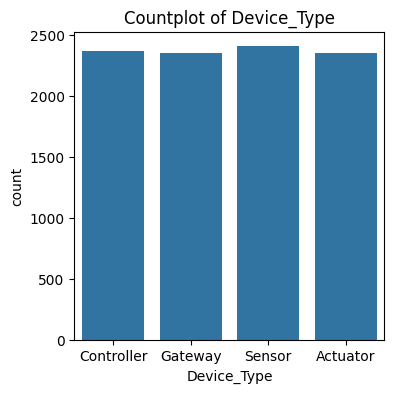

--- Environment ---
Environment
Indoor         2427
Outdoor        2369
Residential    2365
Industrial     2327
Name: count, dtype: int64


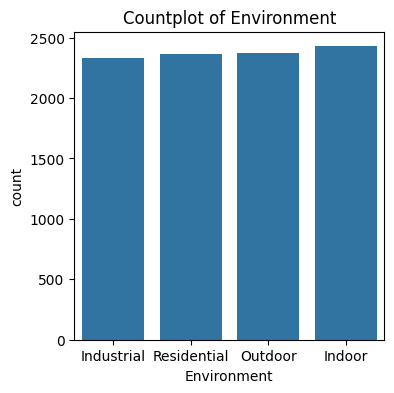

In [ ]:
for col in df.select_dtypes(include=['object']).columns:
    print(f"--- {col} ---")
    print(df[col].value_counts())

    plt.figure(figsize=(4,4))
    sns.countplot(x=col, data=df)
    plt.title(f"Countplot of {col}")
    plt.show()

Univariate Numerical columns

Column name: Feature_1
count    9488.000000
mean       -0.016445
std         0.998772
min        -3.044657
25%        -0.693712
50%        -0.012527
75%         0.660357
max         3.013793
Name: Feature_1, dtype: float64
Skewness: -0.011707960801298411
Kurtosis: -0.12861923252296004



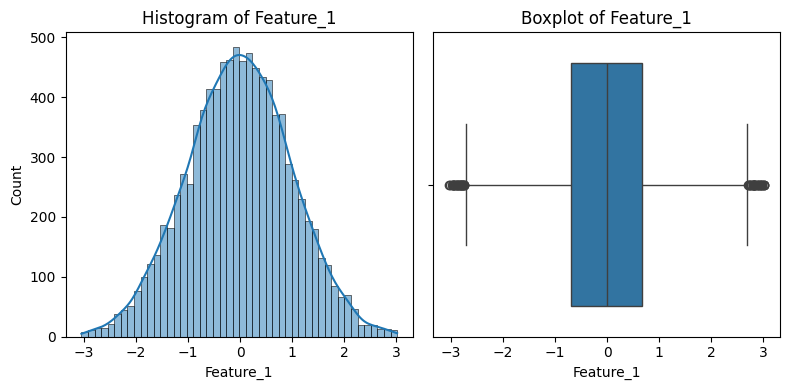

Column name: Feature_2
count    9488.000000
mean        0.001211
std         1.008693
min        -3.055841
25%        -0.696193
50%        -0.000422
75%         0.685682
max         3.057651
Name: Feature_2, dtype: float64
Skewness: 0.021072479821886474
Kurtosis: -0.1631254005048639



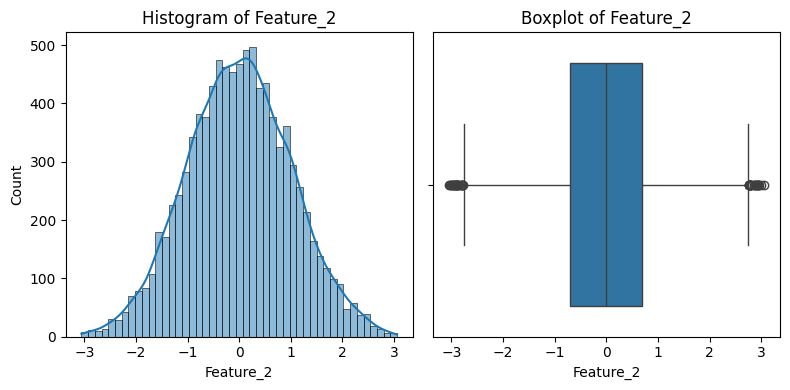

Column name: Feature_3
count    9488.000000
mean        0.017821
std         0.934416
min        -2.817884
25%        -0.568642
50%         0.018377
75%         0.608341
max         2.825588
Name: Feature_3, dtype: float64
Skewness: -0.027688178477716714
Kurtosis: 0.09331388313655564



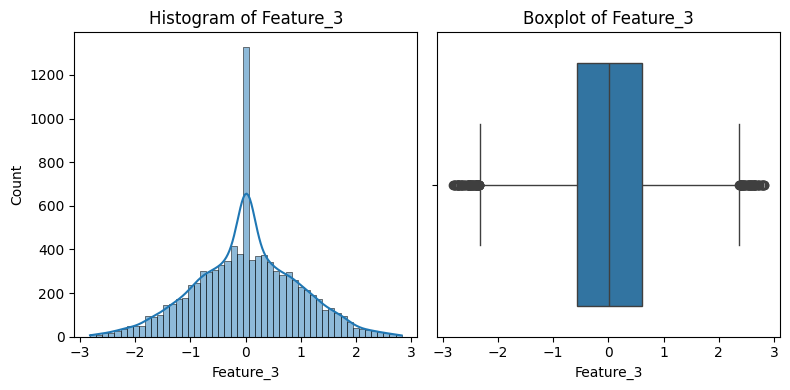

Column name: Feature_4
count    9488.000000
mean       -0.006924
std         0.983626
min        -2.985972
25%        -0.684124
50%        -0.008075
75%         0.656980
max         2.969510
Name: Feature_4, dtype: float64
Skewness: -0.0013201150413773117
Kurtosis: -0.1851923911672122



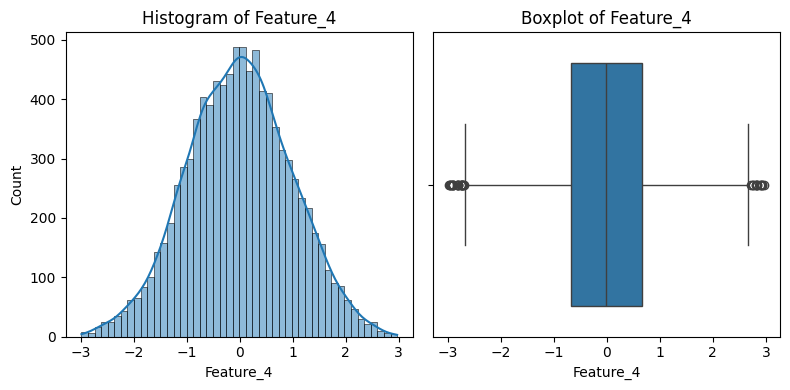

Column name: Feature_5
count    9488.000000
mean        0.013345
std         1.017651
min        -3.548638
25%        -0.669303
50%         0.027942
75%         0.696934
max         3.611350
Name: Feature_5, dtype: float64
Skewness: -0.024160016753345157
Kurtosis: 0.0025462002766913905



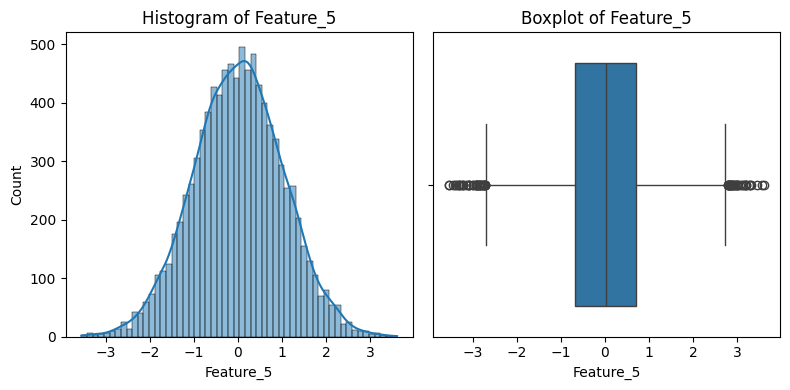

Column name: Feature_6
count    9488.000000
mean       -0.006632
std         0.985565
min        -2.972195
25%        -0.676289
50%        -0.006696
75%         0.657538
max         2.984025
Name: Feature_6, dtype: float64
Skewness: 0.034870866326134134
Kurtosis: -0.15872366038916574



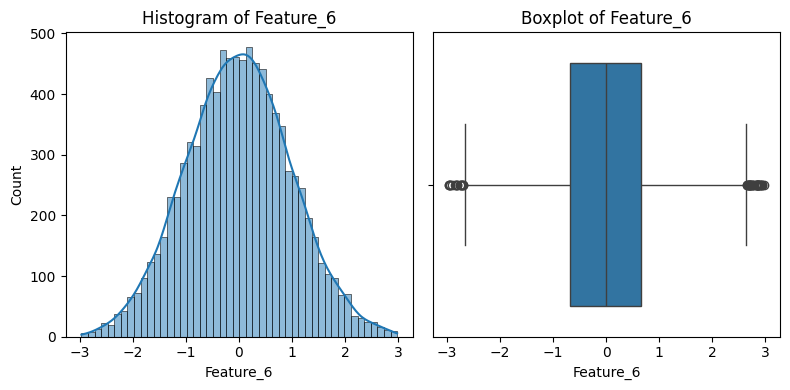

Column name: Feature_7
count    9488.000000
mean        0.010931
std         0.932531
min        -2.823824
25%        -0.576580
50%         0.012845
75%         0.605163
max         2.815753
Name: Feature_7, dtype: float64
Skewness: -0.012004531203306436
Kurtosis: 0.0841388339481357



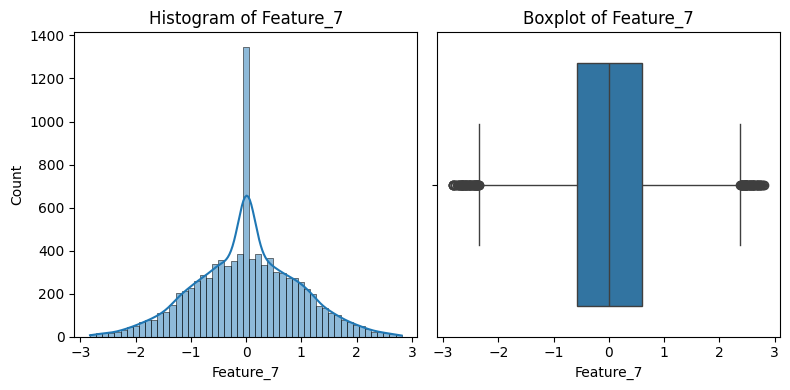

Column name: Feature_8
count    9488.000000
mean       -0.014316
std         0.982904
min        -2.993248
25%        -0.690763
50%        -0.008688
75%         0.659183
max         2.935967
Name: Feature_8, dtype: float64
Skewness: -0.005376531502123164
Kurtosis: -0.21578920123934697



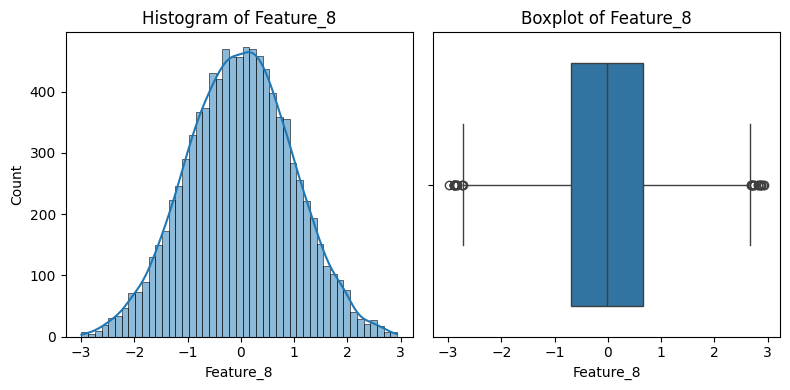

Column name: Feature_9
count    9488.000000
mean        0.000822
std         0.969414
min        -2.934700
25%        -0.663360
50%         0.005226
75%         0.673023
max         2.943648
Name: Feature_9, dtype: float64
Skewness: 0.008920028145599323
Kurtosis: -0.16169575565111804



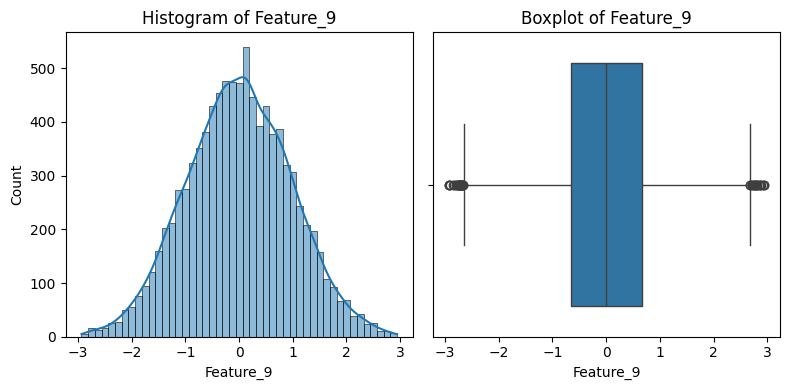

Column name: Feature_10
count    9488.000000
mean        0.007716
std         0.984505
min        -2.982542
25%        -0.664425
50%         0.009259
75%         0.670508
max         2.998734
Name: Feature_10, dtype: float64
Skewness: 0.018020534083272227
Kurtosis: -0.1756975184629801



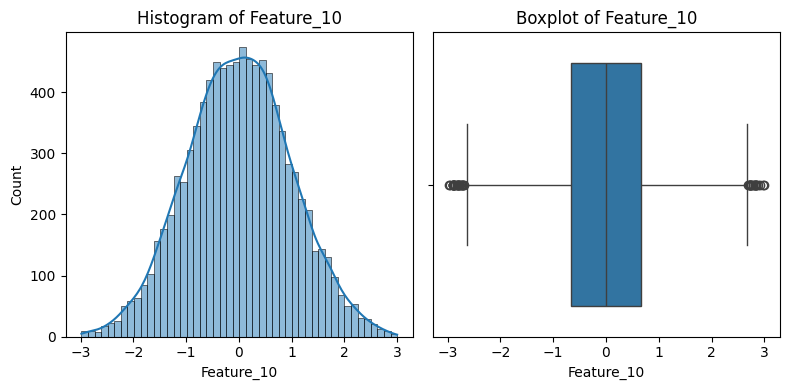

Column name: Feature_11
count    9488.000000
mean       -0.006450
std         0.929112
min        -2.846374
25%        -0.585355
50%        -0.005539
75%         0.571261
max         2.828157
Name: Feature_11, dtype: float64
Skewness: 0.0026535412392798565
Kurtosis: 0.1668229765377487



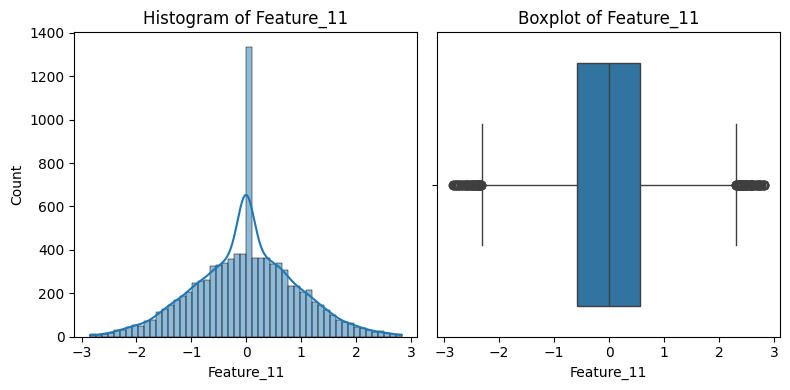

Column name: Feature_12
count    9488.000000
mean        0.006565
std         0.981625
min        -2.913074
25%        -0.664363
50%         0.006408
75%         0.680394
max         2.975907
Name: Feature_12, dtype: float64
Skewness: -0.006008204108740505
Kurtosis: -0.17149433439814077



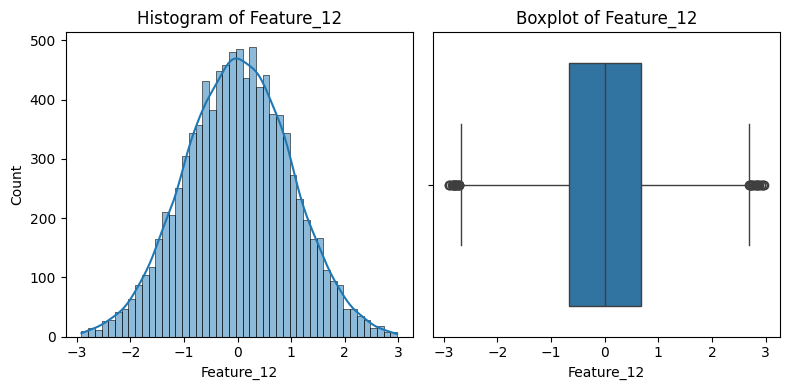

Column name: Feature_13
count    9488.000000
mean        0.011661
std         0.988925
min        -2.959055
25%        -0.654419
50%         0.003193
75%         0.691090
max         2.945284
Name: Feature_13, dtype: float64
Skewness: -0.0017614111294979012
Kurtosis: -0.2166248981086616



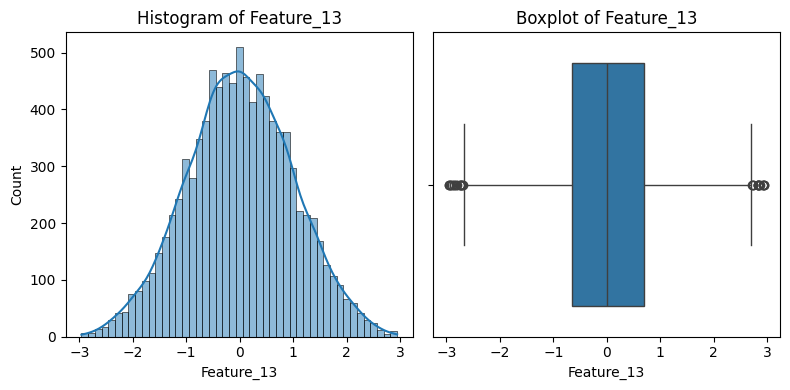

Column name: Feature_14
count    9488.000000
mean        0.011639
std         0.985740
min        -2.965956
25%        -0.651707
50%         0.013294
75%         0.679800
max         3.001669
Name: Feature_14, dtype: float64
Skewness: -0.026470500586039756
Kurtosis: -0.13307594628883423



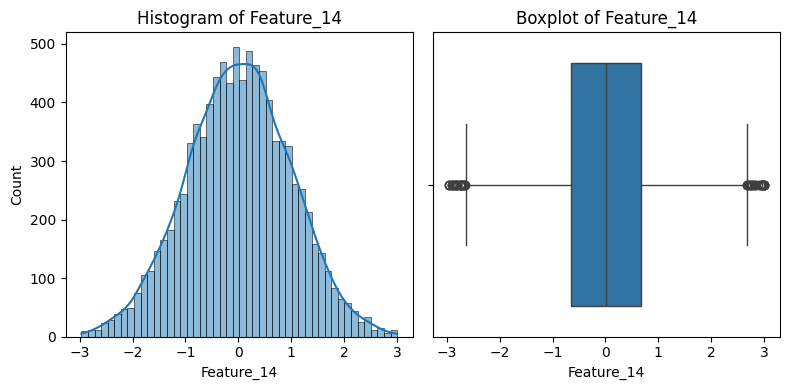

Column name: Feature_15
count    9488.000000
mean        0.009961
std         0.982958
min        -2.933435
25%        -0.653345
50%        -0.003888
75%         0.671627
max         2.985259
Name: Feature_15, dtype: float64
Skewness: 0.012187725421459105
Kurtosis: -0.16467589075070066



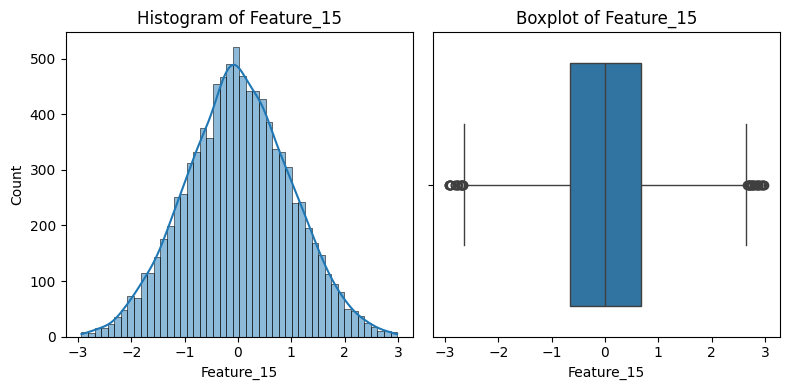

Column name: Power_Efficiency
count    9488.000000
mean      103.653557
std       173.600874
min      -424.136662
25%       -14.078668
50%       103.783409
75%       219.576060
max       633.184275
Name: Power_Efficiency, dtype: float64
Skewness: 0.021588568878226123
Kurtosis: -0.1653042954480548



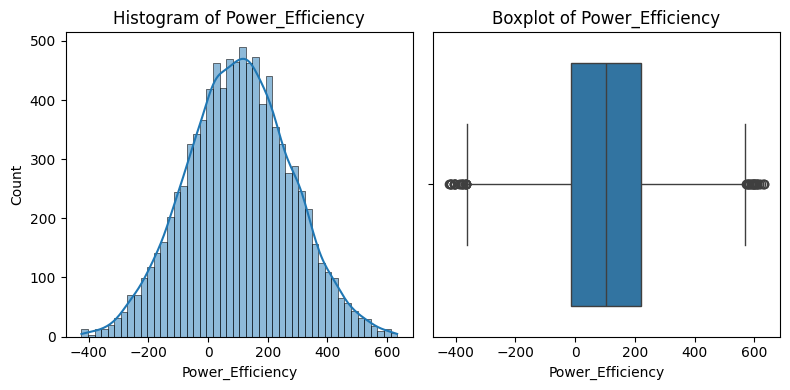

In [ ]:
for index, col in enumerate(df.select_dtypes(include=['number']).columns):
  print(f"Column name: {col}")
  print(df[col].describe())   # 5 point summary statistics
  print(f"Skewness: {df[col].skew()}")
  print(f"Kurtosis: {df[col].kurt()}")
  print()

  fig, ax = plt.subplots(1, 2, figsize=(8, 4))

  sns.histplot(df[col], ax=ax[0], kde=True)
  ax[0].set_title(f"Histogram of {col}")

  sns.boxplot(x=df[col], ax=ax[1])
  ax[1].set_title(f"Boxplot of {col}")

  plt.tight_layout()
  plt.show()


## Bivariate Analysis

1.   All numerical features are relatively independent further hinting at PCA or similar technique being used. No correlation found between different features
2.   Target variable is correlated to features 14,15,11,7 and 3 (with some weak correlation with 1,5,6)
3.   In 'device type' 'actuators' have max. avg. Power_efficency while in 'environment' 'industrial' and 'indoor' have max. avg. Power_efficency
4.   Cross tab values of both object object dtypes have ~600 in each segment so no trend seen there either


Numerical-Numerical features

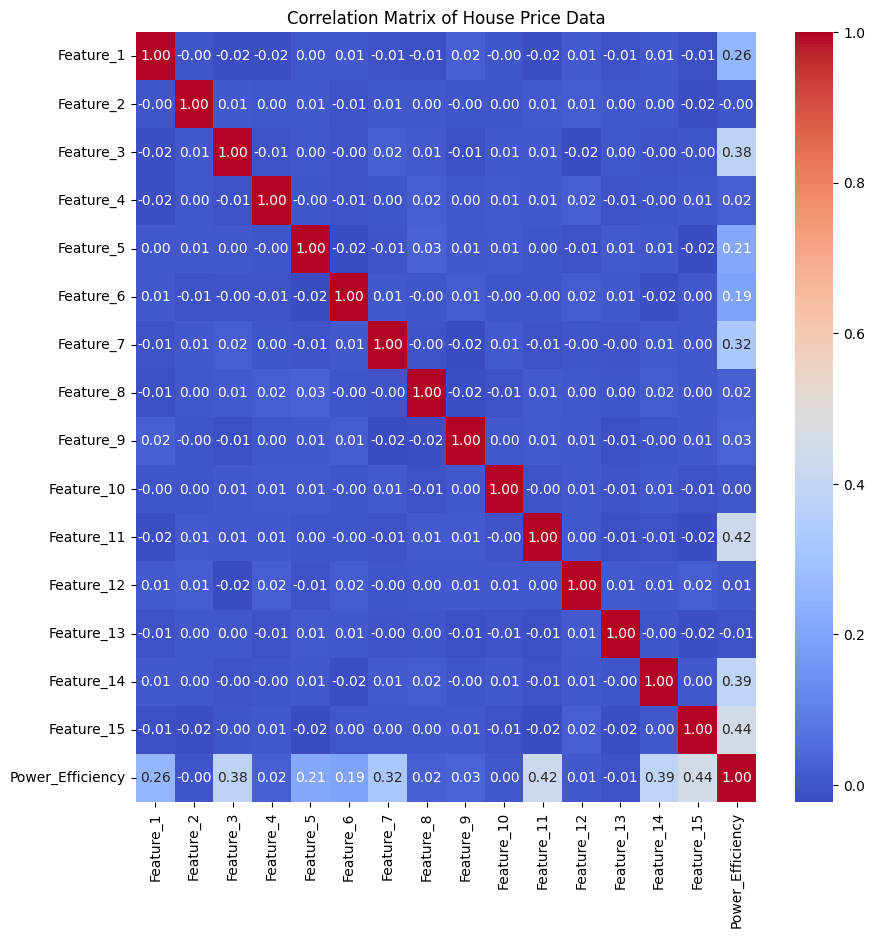

In [ ]:
corr_matrix = df_clean.select_dtypes(include="number").corr()

plt.figure(figsize=(10,10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of House Price Data")
plt.show()

<Figure size 4000x4000 with 0 Axes>

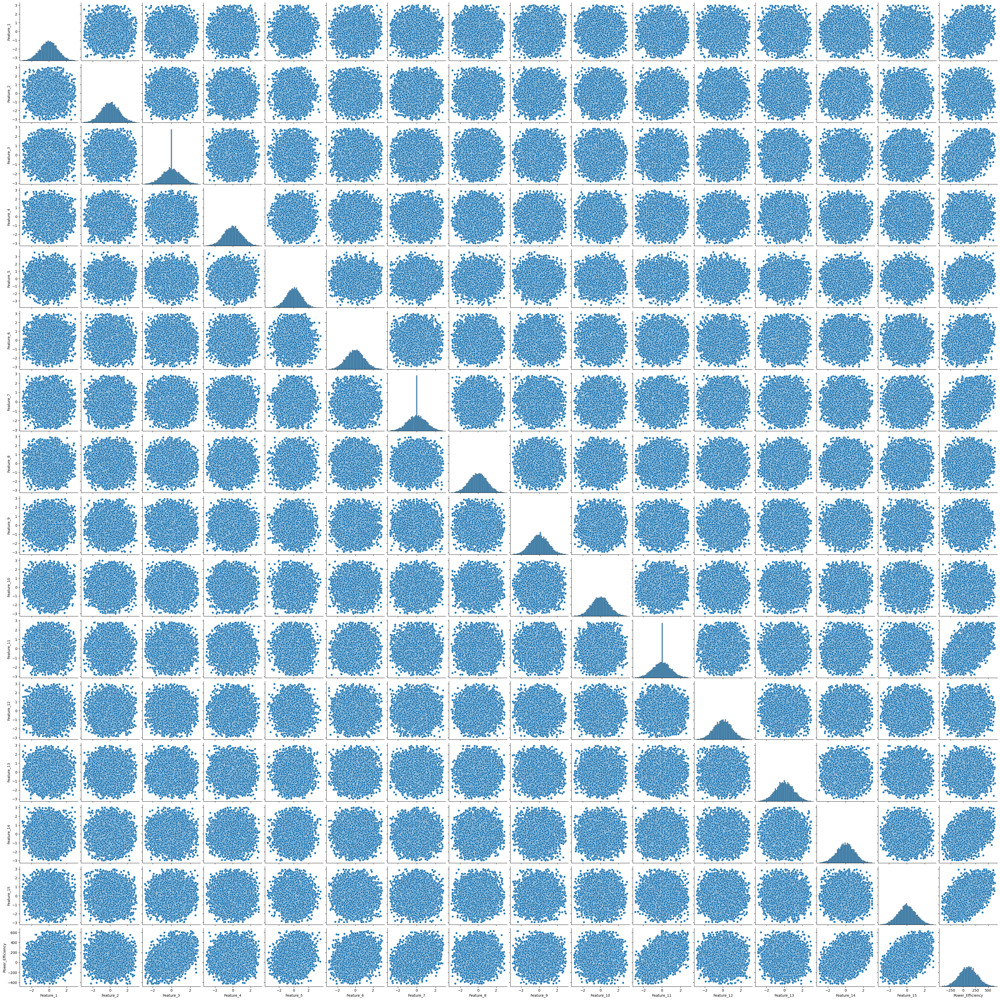

In [ ]:
plt.figure(figsize=(40,40))
sns.pairplot(df_clean.select_dtypes(include="number"),kind='scatter')
plt.show()

Numerical-categorical features

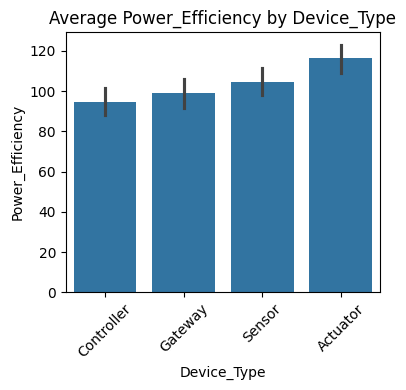

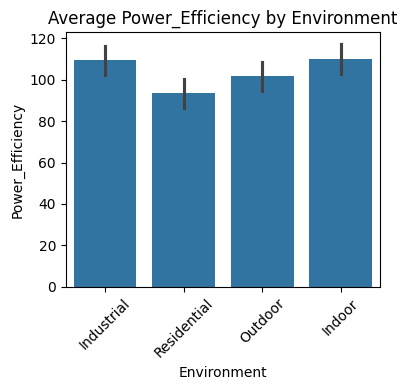

In [ ]:
cat_cols = df.select_dtypes(include=['object', 'category']).columns

# Target variable
target = 'Power_Efficiency'

# Loop through each categorical column
for col in cat_cols:
    plt.figure(figsize=(4, 4))
    sns.barplot(x=col, y=target, data=df, estimator='mean')
    plt.title(f"Average {target} by {col}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



object object

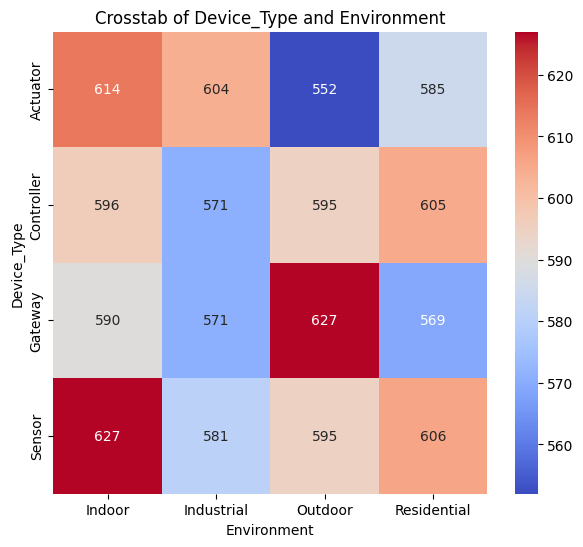

In [ ]:
plt.figure(figsize=(7,6))
sns.heatmap(pd.crosstab(df['Device_Type'], df['Environment']), annot=True, fmt='d', cmap='coolwarm')
plt.title("Crosstab of Device_Type and Environment")
plt.show()


# Statistical analysis of categorical columns impact on Target


1.   Device type does have difference in Power_Efficency, so does Environment but it doesnt mean it contributes to variance of Power_Efficency very heavily

2.   To see if that contribution towards variance of Power_Efficency is high, we will plot correlation matrix after one hot encoding


In [ ]:
from scipy.stats import f_oneway


groups = [df[df['Device_Type'] == cat]['Power_Efficiency'] for cat in df['Device_Type'].unique()]

anova_stat, p_value = f_oneway(*groups)

print(f"ANOVA F-statistic: {anova_stat:.4f}")
print(f"p-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant difference across device types (Reject H₀)")
else:
    print("No significant difference (Fail to reject H₀)")


ANOVA F-statistic: 6.8221
p-value: 0.0001
Significant difference across device types (Reject H₀)


In [ ]:
# Environment

from scipy.stats import f_oneway


groups = [df[df['Environment'] == cat]['Power_Efficiency'] for cat in df['Environment'].unique()]

anova_stat, p_value = f_oneway(*groups)

print(f"ANOVA F-statistic: {anova_stat:.4f}")
print(f"p-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant difference across Environment types (Reject H₀)")
else:
    print("No significant difference (Fail to reject H₀)")

ANOVA F-statistic: 4.6771
p-value: 0.0029
Significant difference across Environment types (Reject H₀)


# Preprocessing (One Hot Endcoding)
1.   We will use one hot encoding for object type features.
2.   We see that both categorical columns have no significant corr. with target





In [ ]:
from sklearn.preprocessing import OneHotEncoder

# Select categorical columns
cat_cols = df.select_dtypes(include=['object']).columns

# Initialize encoder
ohe = OneHotEncoder(drop='first', sparse_output=False)

# Fit and transform
encoded = ohe.fit_transform(df[cat_cols])

# Convert to DataFrame
encoded_df = pd.DataFrame(encoded, columns=ohe.get_feature_names_out(cat_cols))

# Combine with numeric columns
df_final = pd.concat([df.drop(columns=cat_cols).reset_index(drop=True),
                        encoded_df.reset_index(drop=True)], axis=1)

df_final.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,...,Feature_13,Feature_14,Feature_15,Power_Efficiency,Device_Type_Controller,Device_Type_Gateway,Device_Type_Sensor,Environment_Industrial,Environment_Outdoor,Environment_Residential
0,-1.529631,-0.229829,-1.133380,-0.032698,-0.023546,0.190398,-0.044578,1.617860,0.422554,0.757900,...,0.674063,-0.532892,1.238310,26.110262,1.0,0.0,0.0,1.0,0.0,0.0
1,-0.489570,-0.088583,-0.791501,-0.899364,1.157639,-0.824769,0.217582,-0.045827,-0.145721,1.664233,...,0.843380,0.200462,-2.538103,-55.054269,0.0,1.0,0.0,0.0,0.0,1.0
2,-0.704766,-0.672018,-2.769177,-0.377164,0.059146,-2.021345,0.542038,0.848163,-2.301764,-0.284346,...,1.569515,-0.010277,-0.460736,-221.579909,0.0,0.0,1.0,1.0,0.0,0.0
3,0.140443,1.279102,-0.309443,-0.488906,1.648295,-2.332286,-0.350755,-0.104239,-1.211797,-0.458519,...,-0.822441,0.619504,1.391085,33.307775,1.0,0.0,0.0,0.0,0.0,1.0
4,0.384900,0.183544,-1.207033,0.755742,-0.582918,-2.475565,0.274686,-0.136788,0.309404,-1.805481,...,2.526582,1.172795,2.056307,122.417840,1.0,0.0,0.0,0.0,0.0,1.0


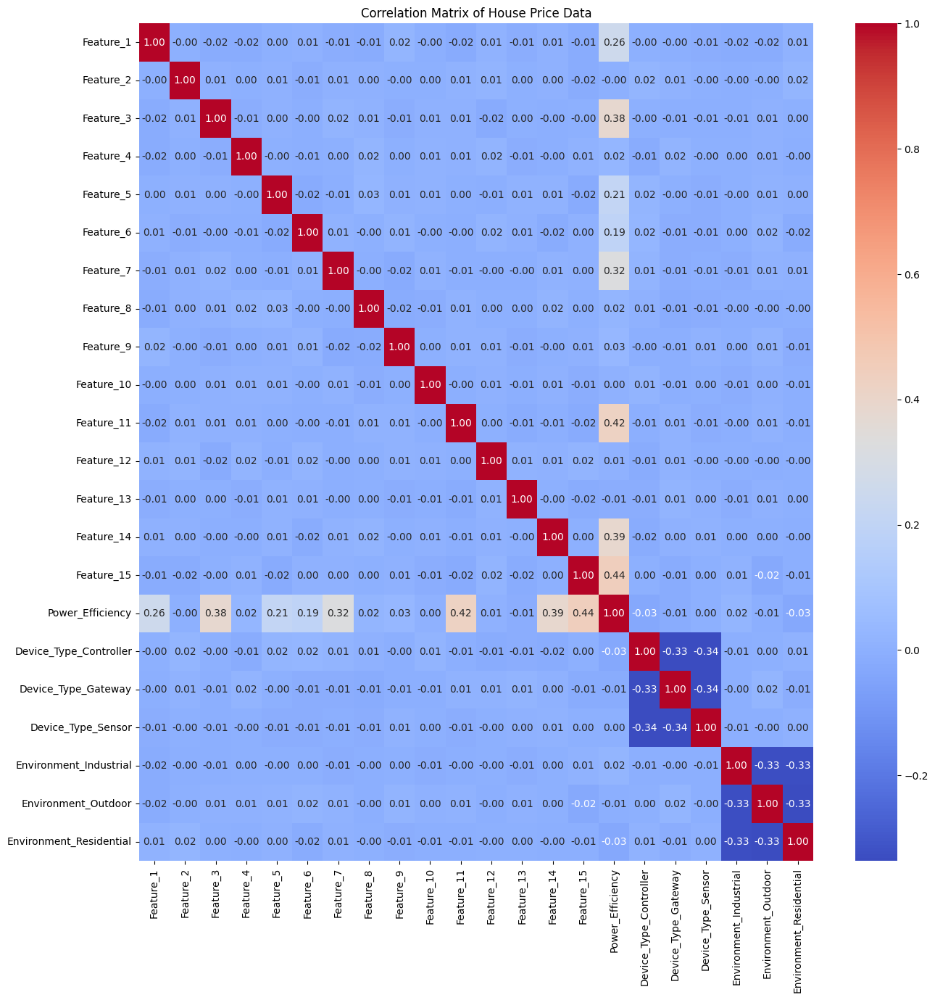

In [ ]:
corr_matrix = df_final.select_dtypes(include="number").corr()

plt.figure(figsize=(15,15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix of House Price Data")
plt.show()

# Feature selection and importance
VIF → looks at relationships between features (detects redundancy).

MI → looks at relationship between each feature and the target (detects usefulness)

In [ ]:
from sklearn.feature_selection import mutual_info_regression
df_num=df_final.select_dtypes(include=['number'])
x=df_num.drop(["Power_Efficiency"],axis=1)
y=df_num["Power_Efficiency"]



mi=mutual_info_regression(x,y)        #More is better
mi_df=pd.DataFrame({"feature":x.columns, "MI score":mi}).sort_values(by="MI score",ascending=False)
mi_df

,feature,MI score
10,Feature_11,0.108034
14,Feature_15,0.100854
2,Feature_3,0.079394
13,Feature_14,0.079352
6,Feature_7,0.049648
0,Feature_1,0.030101
5,Feature_6,0.020672
4,Feature_5,0.013111
7,Feature_8,0.007837
17,Device_Type_Sensor,0.005154


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

from statsmodels.tools.tools import add_constant

df_num = df_final.select_dtypes(include=['number'])


vif_threshold = 5       #More than this is rejected
features = list(df_num.columns)

while True:
    # Add constant for VIF calculation. I forget this so a reminder
    data_with_const = add_constant(df_num[features])

    vif = pd.DataFrame()
    vif['Feature'] = data_with_const.columns
    vif['VIF'] = [variance_inflation_factor(data_with_const.values, i) for i in range(data_with_const.shape[1])]

    vif = vif[vif['Feature'] != 'const']      #here the .drop() wont work because it expects column name or index label

    max_vif = vif['VIF'].max()

    if max_vif > vif_threshold:
        # Drop the feature with highest VIF
        drop_feature = vif.sort_values('VIF', ascending=False)['Feature'].iloc[0]
        print(f"Dropping '{drop_feature}' with VIF={max_vif:.2f}")
        features.remove(drop_feature)
    else:
        break

# Final features with acceptable VIF
print("\nRemaining features with VIF below threshold:")
print(vif[vif['VIF'] <= vif_threshold])


Dropping 'Power_Efficiency' with VIF=18.42

Remaining features with VIF below threshold:
                    Feature       VIF
1                 Feature_1  1.003252
2                 Feature_2  1.002419
3                 Feature_3  1.001864
4                 Feature_4  1.001810
5                 Feature_5  1.002936
6                 Feature_6  1.002595
7                 Feature_7  1.001815
8                 Feature_8  1.003002
9                 Feature_9  1.002282
10               Feature_10  1.001276
11               Feature_11  1.001730
12               Feature_12  1.002274
13               Feature_13  1.001572
14               Feature_14  1.001227
15               Feature_15  1.003258
16   Device_Type_Controller  1.509373
17      Device_Type_Gateway  1.507709
18       Device_Type_Sensor  1.511737
19   Environment_Industrial  1.479957
20      Environment_Outdoor  1.486729
21  Environment_Residential  1.484153


# Train Test Splitting and Scaling

In [ ]:
x=df_final[['Feature_1', 'Feature_3', 'Feature_5', 'Feature_6', 'Feature_7','Feature_11', 'Feature_14', 'Feature_15']]
y=df_final["Power_Efficiency"]
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=21)

we are not scaling the data as the data is already normal and centered at mean~0 and std ~1

In [ ]:
# scaler = StandardScaler()
# x_train = scaler.fit_transform(x_train)      # Fit on training data only
# x_test = scaler.transform(x_test)            # Transform test data using training statistics

# Model Training and evaluation

## Linear Models

### OLS Report for Linear Regression

In [ ]:

X_train_sm = sm.add_constant(x_train)
lr = sm.OLS(y_train,X_train_sm).fit()
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:       Power_Efficiency   R-squared:                       0.944
Model:                            OLS   Adj. R-squared:                  0.944
Method:                 Least Squares   F-statistic:                     5339.
Date:                Mon, 03 Nov 2025   Prob (F-statistic):               0.00
Time:                        15:44:44   Log-Likelihood:                -34107.
No. Observations:                6641   AIC:                         6.826e+04
Df Residuals:                    6619   BIC:                         6.841e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

Interpretations:

*   Device Type Effect: Controllers, Gateways, and Sensors all show significantly lower Power_Efficiency than the base type, with Controllers being the least efficient (≈18 units lower on average).
*   Environment Effect: Industrial environments slightly improve efficiency, while Outdoor and especially Residential settings significantly reduce it.
*   Analysis confirmed that both numerical and categorical predictors significantly influence Power_Efficiency (p < 0.05 for most features). Device_Type and Environment are strong categorical determinants, while Feature_3, Feature_11, Feature_14, and Feature_15 are the primary numerical drivers.
*   Model is stable and reliable, though residuals show mild non-normality from outliers






### Linear Regression


Training

In [ ]:
lr0=LinearRegression()
lr0.fit(x_train,y_train)

LinearRegression()

Model Evaluation

In [ ]:
mse_test=mean_squared_error(y_test,lr0.predict(x_test))
r2_test=r2_score(y_test,lr0.predict(x_test))
mse_train=mean_squared_error(y_train,lr0.predict(x_train))
r2_train=r2_score(y_train,lr0.predict(x_train))

print(f"Test MSE: {mse_test:.2f}")
print(f"Test R2: {r2_test:.2f}")
print(f"Train MSE: {mse_train:.2f}")
print(f"Train R2: {r2_train:.2f}")


Test MSE: 1634.94
Test R2: 0.94
Train MSE: 1835.56
Train R2: 0.94


In [ ]:
def adjusted_r2(r2, n, p):
  return 1 - ((1 - r2) * (n - 1) / (n - p - 1))


In [ ]:
n_train, n_test = x_train.shape[0], x_test.shape[0]
p = x_train.shape[1]

# Adjusted R²
r2_adj_train = adjusted_r2(r2_train, n_train, p)
r2_adj_test = adjusted_r2(r2_test, n_test, p)

print(f"Train R²: {r2_train:.4f}, Train Adjusted R²: {r2_adj_train:.4f}")
print(f"Test R²:  {r2_test:.4f}, Test Adjusted R²:  {r2_adj_test:.4f}")

Train R²: 0.9443, Train Adjusted R²: 0.9441
Test R²:  0.9489, Test Adjusted R²:  0.9485


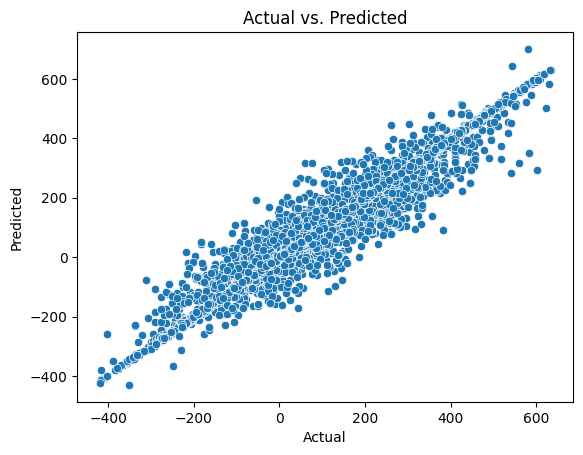

In [ ]:
sns.scatterplot(x=y_train, y=lr0.predict(x_train))
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs. Predicted")
plt.show()

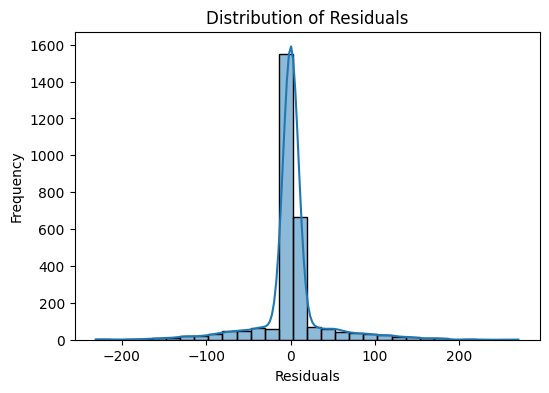

In [ ]:
#Distribution of Residuals (should be roughly normal)
plt.figure(figsize=(6,4))
residuals = y_test - lr0.predict(x_test)
sns.histplot(residuals, bins=30, kde=True)
plt.title("Distribution of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

Model parameters

In [ ]:
cdf = pd.DataFrame(lr0.coef_,x.columns,columns=['Coef']).T
cdf["intercept"]=lr0.intercept_
(cdf)

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,...,Feature_13,Feature_14,Feature_15,Device_Type_Controller,Device_Type_Gateway,Device_Type_Sensor,Environment_Industrial,Environment_Outdoor,Environment_Residential,intercept
Coef,47.084048,-0.242232,70.136875,5.166033,37.526471,35.513917,58.995106,0.860282,4.50771,0.030103,...,1.026886,68.147828,81.427385,-17.959362,-10.674839,-3.977543,2.981975,-6.932029,-15.194194,113.885054


### Lasso with hyperparameter tuning (Grid Search)

In [ ]:
from sklearn.model_selection import GridSearchCV
param_dict = {'alpha': [0.01,0.1, 1.0, 10.0, 100.0]}
lasso = Lasso()

# Initializing our Grid search CV with required parameters
grid_search = GridSearchCV(lasso, param_dict, cv=5)

# Training the data with all values of alpha that we have specified in param_dict
grid_search.fit(x_train, y_train)

print(grid_search.best_params_)
print(grid_search.best_score_)



{'alpha': 0.01}
0.943763390340705


In [ ]:

lr1=Lasso(alpha=0.01)
lr1.fit(x_train,y_train)

Lasso(alpha=0.01)

L1 Model evaluation

In [ ]:
y_pred=lr1.predict(x_test)

mse_test=mean_squared_error(y_test,lr1.predict(x_test))
r2_test=r2_score(y_test,lr1.predict(x_test))
mse_train=mean_squared_error(y_train,lr1.predict(x_train))
r2_train=r2_score(y_train,lr1.predict(x_train))

print(f"Test MSE: {mse_test:.2f}")
print(f"Test R2: {r2_test:.2f}")
print(f"Train MSE: {mse_train:.2f}")
print(f"Train R2: {r2_train:.2f}")


Test MSE: 1512.66
Test R2: 0.95
Train MSE: 1692.18
Train R2: 0.94


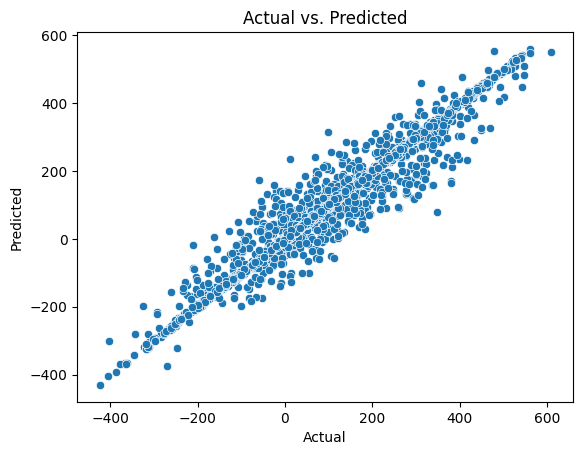

In [ ]:
sns.scatterplot(x=y_test, y=lr1.predict(x_test))
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs. Predicted")
plt.show()


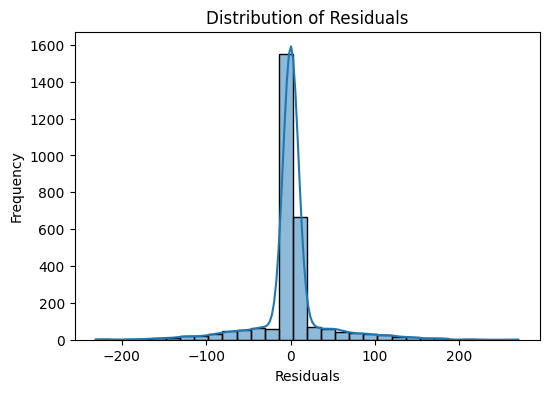

In [ ]:
#Distribution of Residuals (should be roughly normal)
plt.figure(figsize=(6,4))
residuals = y_test - lr1.predict(x_test)
sns.histplot(residuals, bins=30, kde=True)
plt.title("Distribution of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

In [ ]:
cdf = pd.DataFrame(lr1.coef_,x.columns,columns=['Coef']).T
cdf["intercept"]=lr1.intercept_
(cdf)

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,...,Feature_13,Feature_14,Feature_15,Device_Type_Controller,Device_Type_Gateway,Device_Type_Sensor,Environment_Industrial,Environment_Outdoor,Environment_Residential,intercept
Coef,47.075423,-0.234923,70.125824,5.155299,37.516583,35.502255,58.982879,0.851756,4.497081,0.019666,...,1.016036,68.138115,81.416889,-17.794772,-10.512607,-3.815783,2.988084,-6.85187,-15.111411,113.720784


### Ridge with hyperparameter tuning (Grid Search)

In [ ]:
param_dict = {'alpha': [0.01,0.1, 1.0, 10.0, 100.0]}
ridge = Ridge()

grid_search = GridSearchCV(ridge, param_dict, cv=5)

# Training the data with all values of alpha that we have specified in param_dict
grid_search.fit(x_train, y_train)

print(grid_search.best_params_)
print(grid_search.best_score_)



{'alpha': 1.0}
0.9437624283991622


In [ ]:

lr2=Ridge(alpha=0.1)
lr2.fit(x_train,y_train)

Ridge(alpha=0.1)

L2 Model evaluation

In [ ]:
y_pred=lr2.predict(x_test)

from sklearn.metrics import mean_squared_error, r2_score
mse_test=mean_squared_error(y_test,lr2.predict(x_test))
r2_test=r2_score(y_test,lr2.predict(x_test))
mse_train=mean_squared_error(y_train,lr2.predict(x_train))
r2_train=r2_score(y_train,lr2.predict(x_train))

print(f"Test MSE: {mse_test:.2f}")
print(f"Test R2: {r2_test:.2f}")
print(f"Train MSE: {mse_train:.2f}")
print(f"Train R2: {r2_train:.2f}")


Test MSE: 1512.71
Test R2: 0.95
Train MSE: 1692.17
Train R2: 0.94


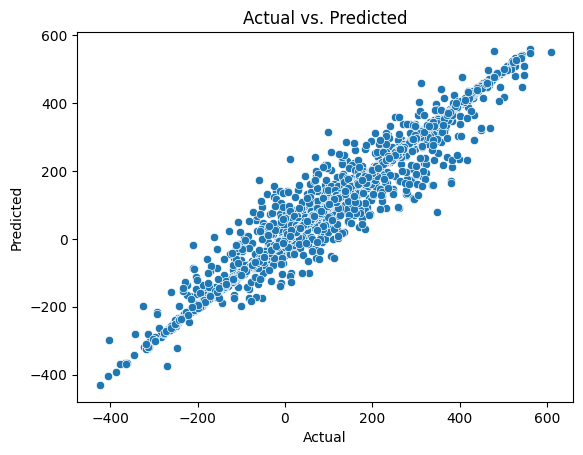

In [ ]:
sns.scatterplot(x=y_test, y=lr2.predict(x_test))
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs. Predicted")
plt.show()


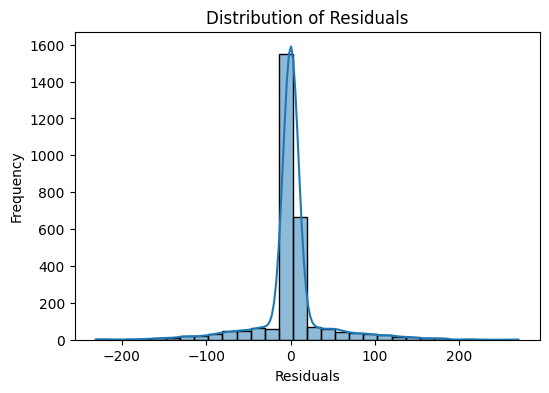

In [ ]:
#Distribution of Residuals (should be roughly normal)
plt.figure(figsize=(6,4))
residuals = y_test - lr2.predict(x_test)
sns.histplot(residuals, bins=30, kde=True)
plt.title("Distribution of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

In [ ]:
cdf = pd.DataFrame(lr2.coef_,x.columns,columns=['Coef']).T
cdf["intercept"]=lr2.intercept_
(cdf)

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,...,Feature_13,Feature_14,Feature_15,Device_Type_Controller,Device_Type_Gateway,Device_Type_Sensor,Environment_Industrial,Environment_Outdoor,Environment_Residential,intercept
Coef,47.083287,-0.242285,70.135644,5.165962,37.525889,35.513298,58.994127,0.860347,4.507658,0.030116,...,1.026876,68.146807,81.426079,-17.956248,-10.672151,-3.975308,2.982937,-6.930612,-15.192162,113.882008


### Elastic Net with hyperparameter tuning

In [ ]:
from sklearn.linear_model import ElasticNet

param_dict = {
    "alpha": [0.01, 0.1, 1.0, 10.0, 100.0],   # regularization strength
    "l1_ratio": [0.1, 0.5, 0.7, 0.9, 1.0]     # balance between L1 (lasso) and L2 (ridge)
}

# Initialize model
elastic = ElasticNet(max_iter=10000)

# Grid Search with 5-fold CV
grid_search = GridSearchCV(elastic, param_dict, cv=5)

# Train the model
grid_search.fit(x_train, y_train)

# Best hyperparameters and score
print("Best Parameters:", grid_search.best_params_)
print("Best CV Score:", grid_search.best_score_)


Best Parameters: {'alpha': 0.01, 'l1_ratio': 1.0}
Best CV Score: 0.943763390340705


In [ ]:
elastic = ElasticNet(**grid_search.best_params_)    #passing a dict needs **
elastic.fit(x_train, y_train)

ElasticNet(alpha=0.01, l1_ratio=1.0)

In [ ]:
y_pred=elastic.predict(x_test)

mse_test=mean_squared_error(y_test,elastic.predict(x_test))
r2_test=r2_score(y_test,elastic.predict(x_test))
mse_train=mean_squared_error(y_train,elastic.predict(x_train))
r2_train=r2_score(y_train,elastic.predict(x_train))

print(f"Test MSE: {mse_test:.2f}")
print(f"Test R2: {r2_test:.2f}")
print(f"Train MSE: {mse_train:.2f}")
print(f"Train R2: {r2_train:.2f}")

Test MSE: 1512.66
Test R2: 0.95
Train MSE: 1692.18
Train R2: 0.94


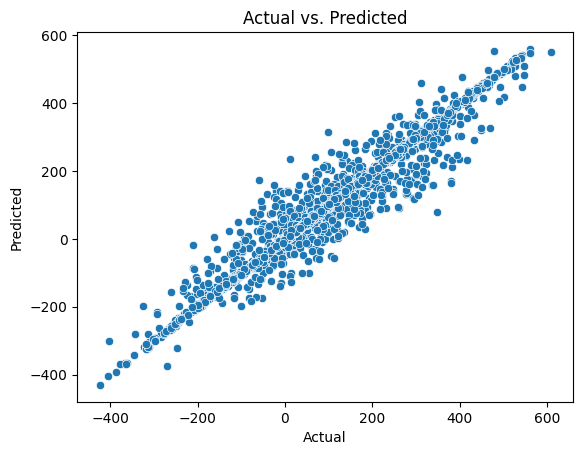

In [ ]:
sns.scatterplot(x=y_test, y=elastic.predict(x_test))
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual vs. Predicted")
plt.show()

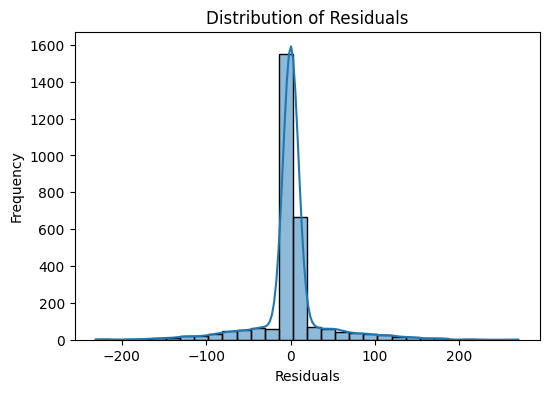

In [ ]:
#Distribution of Residuals (should be roughly normal)
plt.figure(figsize=(6,4))
residuals = y_test - y_pred
sns.histplot(residuals, bins=30, kde=True)
plt.title("Distribution of Residuals")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

In [ ]:
cdf = pd.DataFrame(elastic.coef_,x.columns,columns=['Coef']).T
cdf["intercept"]=elastic.intercept_
(cdf)

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10,...,Feature_13,Feature_14,Feature_15,Device_Type_Controller,Device_Type_Gateway,Device_Type_Sensor,Environment_Industrial,Environment_Outdoor,Environment_Residential,intercept
Coef,47.075423,-0.234923,70.125824,5.155299,37.516583,35.502255,58.982879,0.851756,4.497081,0.019666,...,1.016036,68.138115,81.416889,-17.794772,-10.512607,-3.815783,2.988084,-6.85187,-15.111411,113.720784


### Polynomial Regression with L2 with Hyperparamter Tuning (Grid Search)
since degree returned is 1, it becomes linear regression

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
pipe = Pipeline([('poly', PolynomialFeatures(include_bias=False)),('ridge', Ridge())])


param_grid = {'poly__degree': list(range(1, 5)),'ridge__alpha': [0.001, 0.01, 0.1] }

grid_search = GridSearchCV(pipe, param_grid, cv=3, scoring='r2')
grid_search.fit(x_train, y_train)

best_degree = grid_search.best_params_['poly__degree']
best_alpha  = grid_search.best_params_['ridge__alpha']
print("Best degree:", best_degree)
print("Best alpha:", best_alpha)

y_train_pred = grid_search.predict(x_train)
y_test_pred  = grid_search.predict(x_test)

print("Train R² =", r2_score(y_train, y_train_pred))
print("Test  R² =", r2_score(y_test, y_test_pred))


Best degree: 1
Best alpha: 0.1
Train R² = 0.9442547110493702
Test  R² = 0.9489050853369457


## K-Nearest_Neighbours regression with Hyperparameter Tuning (Random Search)


In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV
knn = KNeighborsRegressor()
odd_k = list(range(1, 20, 2))

param_grid = {'n_neighbors': odd_k}
randomcv = RandomizedSearchCV(knn, param_grid, cv=5, scoring='r2')
randomcv.fit(x_train, y_train)

# Best hyperparameters
print("Best parameters:", randomcv.best_params_)
print("Best CV R²:", randomcv.best_score_)

# Predict on test set
y_pred = randomcv.predict(x_test)

print("Test R²:", r2_score(y_test, y_pred))
print("Test RMSE:", mean_squared_error(y_test, y_pred))


Best parameters: {'n_neighbors': 13}
Best CV R²: 0.8493378564121482
Test R²: 0.8648629206502618
Test RMSE: 4000.843077176846


## Decision Tree
not the right model here

In [ ]:
dt = DecisionTreeRegressor(random_state=42)

param_grid_dt = {
    'max_depth': [3, 5, 7, 9, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

grid_dt = GridSearchCV(
    estimator=dt,
    param_grid=param_grid_dt,
    cv=3,
    scoring='r2',
    n_jobs=-1,
    verbose=2       # show progress
)


grid_dt.fit(x_train, y_train)


print("Best Parameters:", grid_dt.best_params_)


y_pred = grid_dt.predict(x_test)

print("R² Score:", r2_score(y_test, y_pred))
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))


Fitting 3 folds for each of 45 candidates, totalling 135 fits
Best Parameters: {'max_depth': None, 'min_samples_leaf': 4, 'min_samples_split': 2}
R² Score: 0.6209319076825371
RMSE: 105.93686322394817


## Ensemble Models


### Random Forest

In [ ]:
rf = RandomForestRegressor(random_state=42)


rf_params = {
    "n_estimators": [100, 200,400,800],
    "max_depth": [5, 10, 20, 30, 40, None],
    "min_samples_split": [2, 5,8 ,10],
    "min_samples_leaf": [1, 2, 4],
    "bootstrap": [True, False]
}


rf_search = RandomizedSearchCV(
    rf,
    rf_params,
    n_iter=20,
    cv=3,
    scoring='r2',
    n_jobs=-1,
    random_state=42,
    verbose=2
)


rf_search.fit(x_train, y_train)


print("Best Parameters:", rf_search.best_params_)
print("Best CV R²:", rf_search.best_score_)

y_pred = rf_search.predict(x_test)
print("Test R²:", r2_score(y_test, y_pred))
print("MSE:", (mean_squared_error(y_test, y_pred)))

Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Parameters: {'n_estimators': 800, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': None, 'bootstrap': True}
Best CV R²: 0.8139138213780246
Test R²: 0.8277167754282632
MSE: 5100.58489985319


### XG Boost

In [ ]:


xgb = XGBRegressor(random_state=42, eval_metric='rmse')

param_grid_xgb = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2, 0.5]
}

grid_xgb = GridSearchCV(xgb, param_grid_xgb, cv=3, scoring='r2', n_jobs=-1)
grid_xgb.fit(x_train, y_train)

best_xgb = grid_xgb.best_estimator_
y_pred_xgb = best_xgb.predict(x_test)

print("Best XGBoost Params:", grid_xgb.best_params_)
print("R2 Score:", r2_score(y_test, y_pred_xgb))
print("MSE:", mean_squared_error(y_test, y_pred_xgb))


Best XGBoost Params: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
R2 Score: 0.9247280291988073
MSE: 2228.487878637826


### Gradient Boosting

In [ ]:


gbr = GradientBoostingRegressor(random_state=42)

param_dist_gbr = {
    'n_estimators': [100, 150, 200, 250],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 0.9, 1.0]
}

random_search_gbr = RandomizedSearchCV(
    estimator=gbr,
    param_distributions=param_dist_gbr,
    n_iter=20,
    scoring='r2',
    cv=3,
    verbose=1,
    n_jobs=-1,
    random_state=42
)


random_search_gbr.fit(x_train, y_train)


best_gbr = random_search_gbr.best_estimator_

y_pred_gbr = best_gbr.predict(x_test)


print("Best Gradient Boosting Parameters:", random_search_gbr.best_params_)
print("Best CV R²:", random_search_gbr.best_score_)
print("Test R²:", r2_score(y_test, y_pred_gbr))
print("Test MSE:", mean_squared_error(y_test, y_pred_gbr))


Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best Gradient Boosting Parameters: {'subsample': 0.9, 'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': 3, 'learning_rate': 0.1}
Best CV R²: 0.9185516701261585
Test R²: 0.925824873541195
Test MSE: 2196.0149103370563
